<a href="https://colab.research.google.com/github/suryawahyus/MachineLearning/blob/main/TaskWeek4/Visualisasi_Diamond.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
from google.colab import drive
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
file_path = '/content/drive/MyDrive/Machine Learning/dataset/diamonds.csv'

In [5]:
# Baca dataset ke dalam DataFrame
df = pd.read_csv(file_path)

# Tampilkan lima baris pertama dari DataFrame
print(df.head())

   Unnamed: 0  carat      cut color clarity  depth  table  price     x     y  \
0           1   0.23    Ideal     E     SI2   61.5   55.0    326  3.95  3.98   
1           2   0.21  Premium     E     SI1   59.8   61.0    326  3.89  3.84   
2           3   0.23     Good     E     VS1   56.9   65.0    327  4.05  4.07   
3           4   0.29  Premium     I     VS2   62.4   58.0    334  4.20  4.23   
4           5   0.31     Good     J     SI2   63.3   58.0    335  4.34  4.35   

      z  
0  2.43  
1  2.31  
2  2.31  
3  2.63  
4  2.75  


In [6]:
# Menampilkan jumlah nilai unik untuk setiap fitur
unique_counts = df.nunique()

# Menampilkan hasil
print("Jumlah unique value untuk masing-masing fitur:")
for column_name, count in unique_counts.items():
    print(f"{column_name}: {count}")

Jumlah unique value untuk masing-masing fitur:
Unnamed: 0: 53940
carat: 273
cut: 5
color: 7
clarity: 8
depth: 184
table: 127
price: 11602
x: 554
y: 552
z: 375


In [7]:
# Memisahkan kolom berdasarkan tipe data
numerical_features = df.select_dtypes(include=['float64', 'int64'])
categorical_features = df.select_dtypes(include=['object'])
target = df['price']  # Misalnya, 'price' dianggap sebagai kolom target

# Menampilkan hasil
print("Numerical Features:")
print(numerical_features.columns)

print("\nCategorical Features:")
print(categorical_features.columns)

print("\nTarget:")
print(target.name)

Numerical Features:
Index(['Unnamed: 0', 'carat', 'depth', 'table', 'price', 'x', 'y', 'z'], dtype='object')

Categorical Features:
Index(['cut', 'color', 'clarity'], dtype='object')

Target:
price


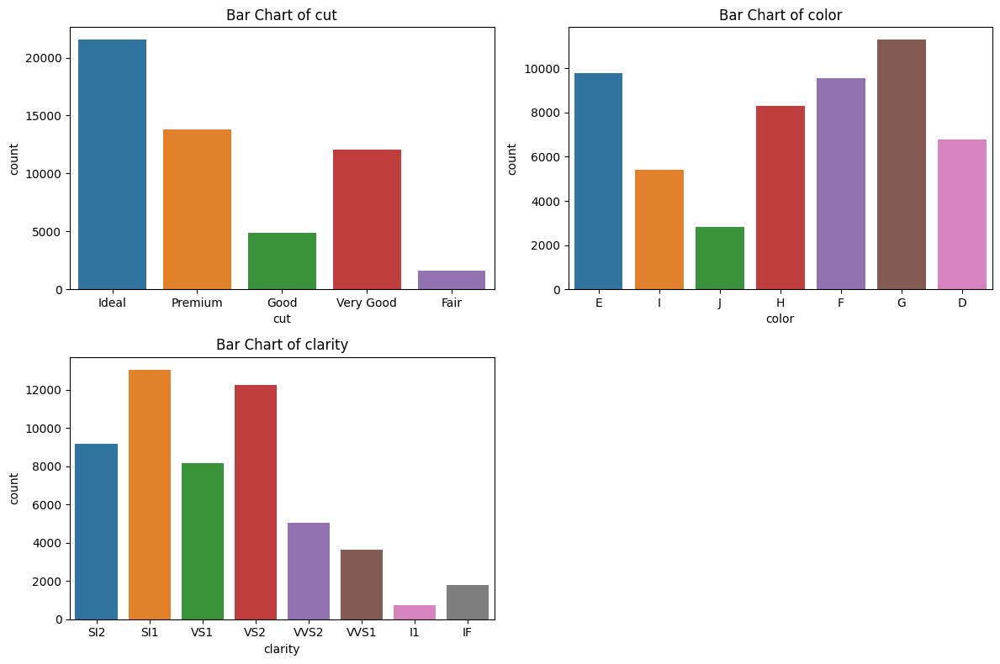

In [8]:
# Memilih kolom kategorikal
categorical_features = df.select_dtypes(include=['object'])

# Menentukan ukuran plot
plt.figure(figsize=(12, 8))

# Loop untuk membuat bar chart untuk setiap kolom kategorikal
for i, column in enumerate(categorical_features.columns, 1):
    plt.subplot(2, 2, i)
    sns.countplot(x=column, data=df)
    plt.title(f'Bar Chart of {column}')

# Menampilkan plot
plt.tight_layout()
plt.show()

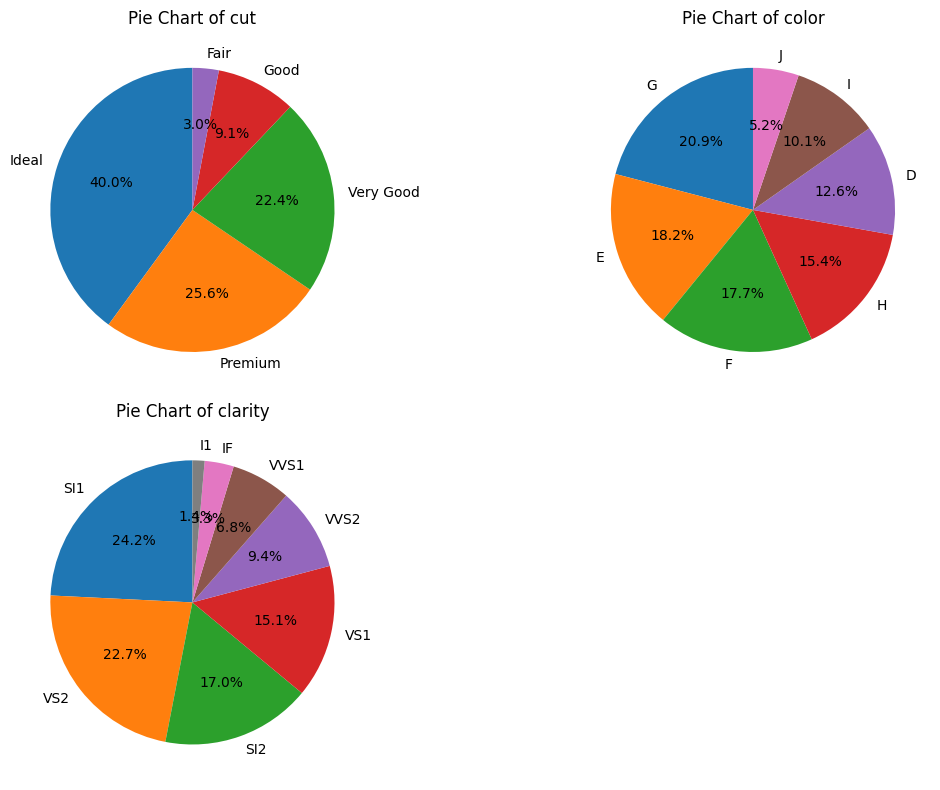

In [9]:
# Memilih kolom kategorikal
categorical_features = df.select_dtypes(include=['object'])

# Menentukan ukuran plot
plt.figure(figsize=(12, 8))

# Loop untuk membuat pie chart untuk setiap kolom kategorikal
for i, column in enumerate(categorical_features.columns, 1):
    plt.subplot(2, 2, i)
    plt.pie(categorical_features[column].value_counts(), labels=categorical_features[column].value_counts().index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Pie Chart of {column}')

# Menampilkan plot
plt.tight_layout()
plt.show()


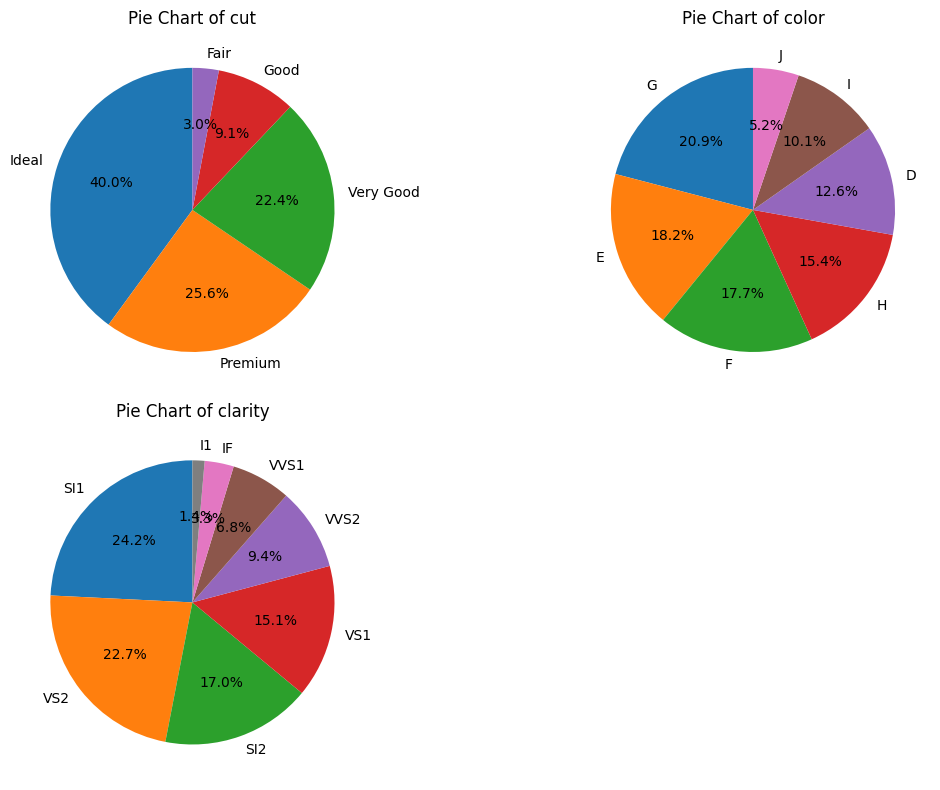

In [10]:
# Menentukan ukuran plot
plt.figure(figsize=(12, 8))

# Definisi palet warna bold
bold_color_palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]

# Loop untuk membuat pie chart untuk setiap kolom kategorikal
for i, column in enumerate(categorical_features.columns, 1):
    plt.subplot(2, 2, i)
    plt.pie(categorical_features[column].value_counts(), labels=categorical_features[column].value_counts().index, autopct='%1.1f%%', startangle=90, colors=bold_color_palette)
    plt.title(f'Pie Chart of {column}')

# Menampilkan plot
plt.tight_layout()
plt.show()

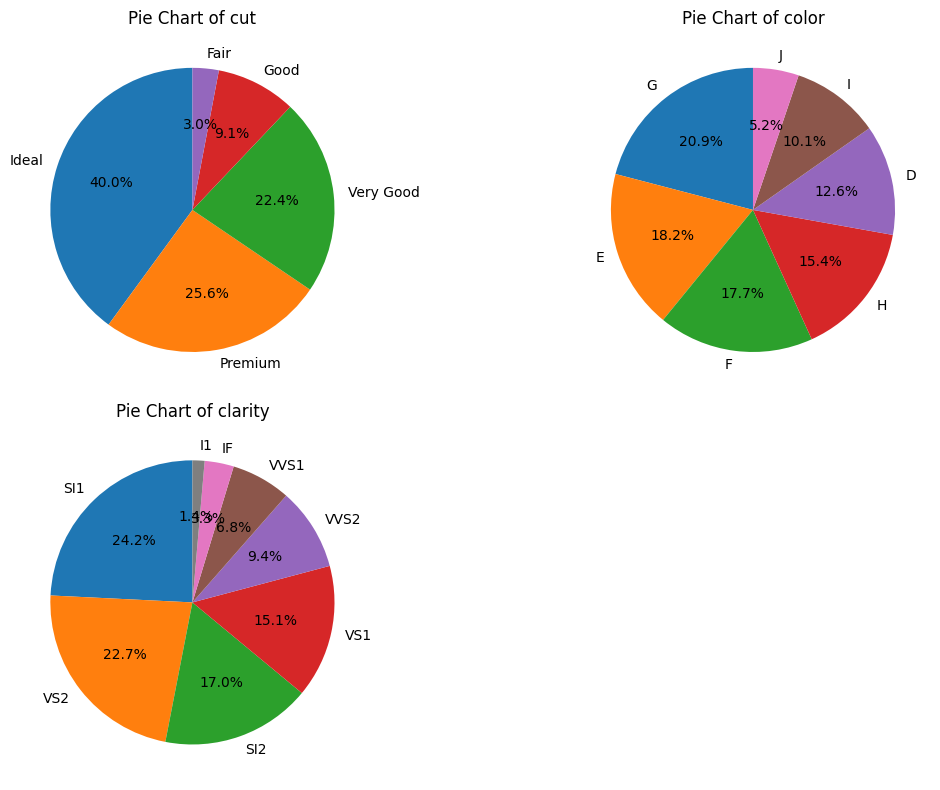

In [11]:
# Menentukan ukuran plot
plt.figure(figsize=(12, 8))

# Daftar warna dark yang akan digunakan
dark_colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf"]

# Loop untuk membuat pie chart untuk setiap kolom kategorikal
for i, column in enumerate(categorical_features.columns, 1):
    plt.subplot(2, 2, i)
    values = categorical_features[column].value_counts()
    plt.pie(values, labels=values.index, autopct='%1.1f%%', startangle=90, colors=dark_colors[:len(values)])
    plt.title(f'Pie Chart of {column}')

# Menampilkan plot
plt.tight_layout()
plt.show()

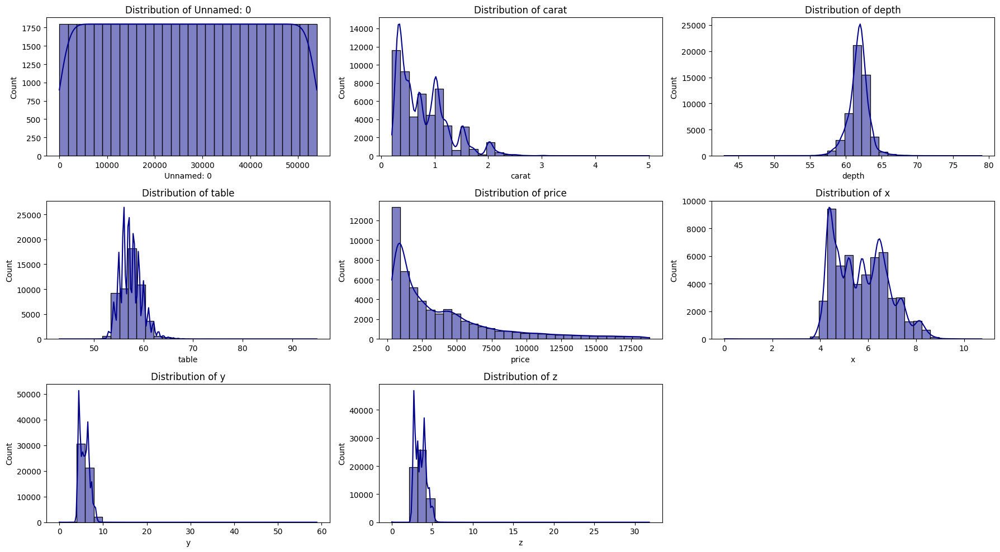

In [13]:
# Memilih kolom numerik
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Menentukan ukuran plot
plt.figure(figsize=(18, 10))

# Membuat grid subplot secara otomatis
num_features = len(numerical_features.columns)
num_cols = 3  # Jumlah kolom pada grid subplot
num_rows = -(-num_features // num_cols)  # Pembulatan ke atas dari hasil bagi

for i, column in enumerate(numerical_features.columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.histplot(df[column], kde=True, bins=30, color='darkblue')
    plt.title(f'Distribution of {column}')

# Menampilkan plot
plt.tight_layout()
plt.show()

In [24]:
# Memilih kolom numerik
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Membuat subplot
fig = make_subplots(rows=len(numerical_features.columns), cols=1, subplot_titles=numerical_features.columns)

# Menambahkan histogram untuk setiap kolom numerik
for i, column in enumerate(numerical_features.columns, 1):
    fig.add_trace(go.Histogram(x=df[column], nbinsx=30, histnorm='probability'), row=i, col=1)

# Mengatur layout
fig.update_layout(height=len(numerical_features.columns) * 250, showlegend=False)

# Menampilkan plot
fig.show()

In [25]:
# Memilih kolom numerik
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Membuat subplot
fig = make_subplots(rows=len(numerical_features.columns), cols=1, subplot_titles=numerical_features.columns)

# Menambahkan histogram untuk setiap kolom numerik
for i, column in enumerate(numerical_features.columns, 1):
    fig.add_trace(go.Histogram(x=df[column], nbinsx=30, histnorm='probability', name=column), row=i, col=1)

# Mengatur layout
fig.update_layout(height=len(numerical_features.columns) * 250, showlegend=True)

# Menambahkan tombol untuk mengatur lebar bin
for i, column in enumerate(numerical_features.columns, 1):
    fig.update_layout(
        updatemenus=[
            dict(
                type="buttons",
                direction="right",
                x=0.95,
                y=1.15 - (i - 1) * 0.1,
                showactive=True,
                buttons=list([
                    dict(label="Auto",
                         method="relayout",
                         args=[f"xaxis{i}", {"autorange": True}]),
                    dict(label="Original",
                         method="relayout",
                         args=[f"xaxis{i}", {"autorange": False, "range": [df[column].min(), df[column].max()]}]),
                    dict(label="Custom",
                         method="relayout",
                         args=[f"xaxis{i}.range", [df[column].min(), df[column].max()]])
                ]),
            )
        ]
    )

# Menampilkan plot
fig.show()

In [26]:
# Memilih kolom numerik
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Membuat boxplot untuk setiap kolom numerik
fig = px.box(numerical_features, points="all")

# Menampilkan plot
fig.show()

In [27]:
# Memilih kolom numerik
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Membuat boxplot horizontal untuk setiap kolom numerik
fig = px.box(numerical_features, points="all", orientation='h')

# Menampilkan plot
fig.show()